In [0]:
#@title Imports
import matplotlib.pyplot as plt
import numpy as np
import pathlib
from PIL import Image
import tensorflow as tf

%matplotlib inline

In [0]:
#@title Constants
GOOGLE_DRIVE_MOUNT      = pathlib.Path('/content/drive')
WORK_DIR                = GOOGLE_DRIVE_MOUNT / 'My Drive' / 'ML Experiments' / 'art-od'
PATH_TO_TEST_IMAGES_DIR = WORK_DIR / 'vangogh'

# Step 1: Test Object Detection Model on Art Images

In [0]:
#@title Install Object Detection API
import os
import sys

!cd /content
!git clone --depth=1 https://github.com/tensorflow/models.git
!pip install tf_slim
!pip install --no-deps tensorflowjs==1.4.0

%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.

pwd = os.getcwd()
os.environ['PYTHONPATH'] += f':{pwd}:{pwd}/slim'
sys.path.append(pwd)
sys.path.append(pwd + '/slim')
%cd /content

from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

Cloning into 'models'...
remote: Enumerating objects: 2633, done.
remote: Counting objects: 100% (2633/2633), done.
remote: Compressing objects: 100% (2294/2294), done.
remote: Total 2633 (delta 528), reused 1317 (delta 305), pack-reused 0
Receiving objects: 100% (2633/2633), 32.13 MiB | 30.90 MiB/s, done.
Resolving deltas: 100% (528/528), done.
     |████████████████████████████████| 358kB 5.0MB/s 
     |████████████████████████████████| 61kB 2.9MB/s 
/content/models/research
object_detection/protos/input_reader.proto: warning: Import object_detection/protos/image_resizer.proto but not used.
/content


In [0]:
#@title Mount Google Drive
from google.colab import drive
drive.mount(str(GOOGLE_DRIVE_MOUNT))

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#@title Helpers
def show_image_mosaic(images, labels, cols=4, thumbnail=256):
    n_images = len(images)
    rows = np.ceil(n_images / float(cols))

    if labels is None:
        labels = [f'Image {i}' for i in range(1, n_images + 1)]
    fig = plt.figure()
    for n, (image, label) in enumerate(zip(images, labels)):
        if thumbnail:
          image = image.copy()
          image.thumbnail((thumbnail, thumbnail))
        image = np.array(image)
        ax = fig.add_subplot(rows, cols, n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        ax.set_title(label)
        ax.set_xticks([])
        ax.set_yticks([])
    fig.set_size_inches(np.array(fig.get_size_inches()) * 6)
    plt.show()

def load_od_api_model(model_name):
    base_url = 'http://download.tensorflow.org/models/object_detection/'
    model_file = model_name + '.tar.gz'
    model_dir = tf.keras.utils.get_file(
        fname=model_name, 
        origin=base_url + model_file,
        untar=True)

    model_dir = pathlib.Path(model_dir)/"saved_model"

    model = tf.saved_model.load(str(model_dir))
    model = model.signatures['serving_default']

    return model

def run_inference_for_single_image(model, image):
    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]

    # Run inference
    output_dict = model(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections

    # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
    
    return output_dict

def annotate_image(model, image_path, category_index, thumbnail=1200):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image = Image.open(image_path)
  image.thumbnail((thumbnail, thumbnail), resample=Image.BICUBIC)
  image_np = np.array(image)
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index=category_index,
      use_normalized_coordinates=True,
      line_thickness=10,
      min_score_thresh=0)

  return Image.fromarray(image_np), output_dict

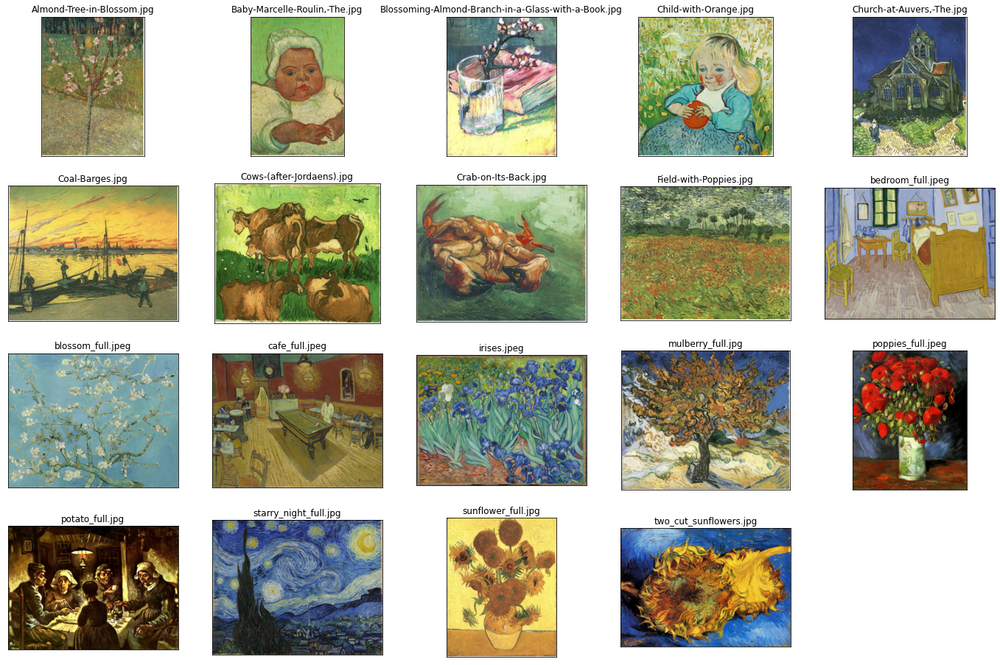

In [0]:
#@title Preview Van Gogh artwork
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")) + list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpeg")))
images = [Image.open(image_path) for image_path in TEST_IMAGE_PATHS]
image_names = [image_path.name for image_path in TEST_IMAGE_PATHS]
show_image_mosaic(images, image_names, cols=5)

In [0]:
#@title Load MSCOCO label map
PATH_TO_LABELS = str(WORK_DIR / 'mscoco_label_map.pbtxt.txt')
# category_index = {}
# with open(PATH_TO_LABELS, 'r') as label_file:
#     stack = []
#     for line in label_file:
#         stack.append(line)
#         if len(stack) != 5:
#             continue
#         stack.pop()  # }
#         display_name = stack.pop().split(':')[1].strip().replace('"', '')
#         label_id = int(stack.pop().split(':')[1].strip())
#         category_index[label_id] = display_name
#         stack.pop()  # name
#         stack.pop()  # item {
# print(category_index)
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)
print(category_index)

{1: {'id': 1, 'name': 'person'}, 2: {'id': 2, 'name': 'bicycle'}, 3: {'id': 3, 'name': 'car'}, 4: {'id': 4, 'name': 'motorcycle'}, 5: {'id': 5, 'name': 'airplane'}, 6: {'id': 6, 'name': 'bus'}, 7: {'id': 7, 'name': 'train'}, 8: {'id': 8, 'name': 'truck'}, 9: {'id': 9, 'name': 'boat'}, 10: {'id': 10, 'name': 'traffic light'}, 11: {'id': 11, 'name': 'fire hydrant'}, 13: {'id': 13, 'name': 'stop sign'}, 14: {'id': 14, 'name': 'parking meter'}, 15: {'id': 15, 'name': 'bench'}, 16: {'id': 16, 'name': 'bird'}, 17: {'id': 17, 'name': 'cat'}, 18: {'id': 18, 'name': 'dog'}, 19: {'id': 19, 'name': 'horse'}, 20: {'id': 20, 'name': 'sheep'}, 21: {'id': 21, 'name': 'cow'}, 22: {'id': 22, 'name': 'elephant'}, 23: {'id': 23, 'name': 'bear'}, 24: {'id': 24, 'name': 'zebra'}, 25: {'id': 25, 'name': 'giraffe'}, 27: {'id': 27, 'name': 'backpack'}, 28: {'id': 28, 'name': 'umbrella'}, 31: {'id': 31, 'name': 'handbag'}, 32: {'id': 32, 'name': 'tie'}, 33: {'id': 33, 'name': 'suitcase'}, 34: {'id': 34, 'name'

In [0]:
#@title Load SSD Mobilenet v1 Model
model_name = 'ssd_mobilenet_v1_coco_2018_01_28'
detection_model = load_od_api_model(model_name)

76546048/76541073 [==============================] - 1s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Almond-Tree-in-Blossom.jpg
Detected:  []

Baby-Marcelle-Roulin,-The.jpg
Detected:  ['person']

Blossoming-Almond-Branch-in-a-Glass-with-a-Book.jpg
Detected:  ['cup']

Child-with-Orange.jpg
Detected:  ['person']

Church-at-Auvers,-The.jpg
Detected:  []

Coal-Barges.jpg
Detected:  ['person']

Cows-(after-Jordaens).jpg
Detected:  ['vase']

Crab-on-Its-Back.jpg
Detected:  []

Field-with-Poppies.jpg
Detected:  []

bedroom_full.jpeg
Detected:  ['chair']

blossom_full.jpeg
Detected:  []

cafe_full.jpeg
Detected:  ['person', 'clock']

irises.jpeg
Detected:  ['potted plant']

mulberry_full.jpg
Detected:  ['bed']

poppies_full.jpeg
Detected:  ['vase', 'potted plant']

potato_full.jpg
Detected:  ['person', 'person', 'person', 'person', 'person', 'person', 'person']

starry_night_full.jpg
Detected:  ['fire hydrant']

sunflower_full.jpg
Detected:  ['teddy bear', 'person']

two_cut_sunflowers.jpg
Detected:  ['fire hydrant', 'fire hydrant']



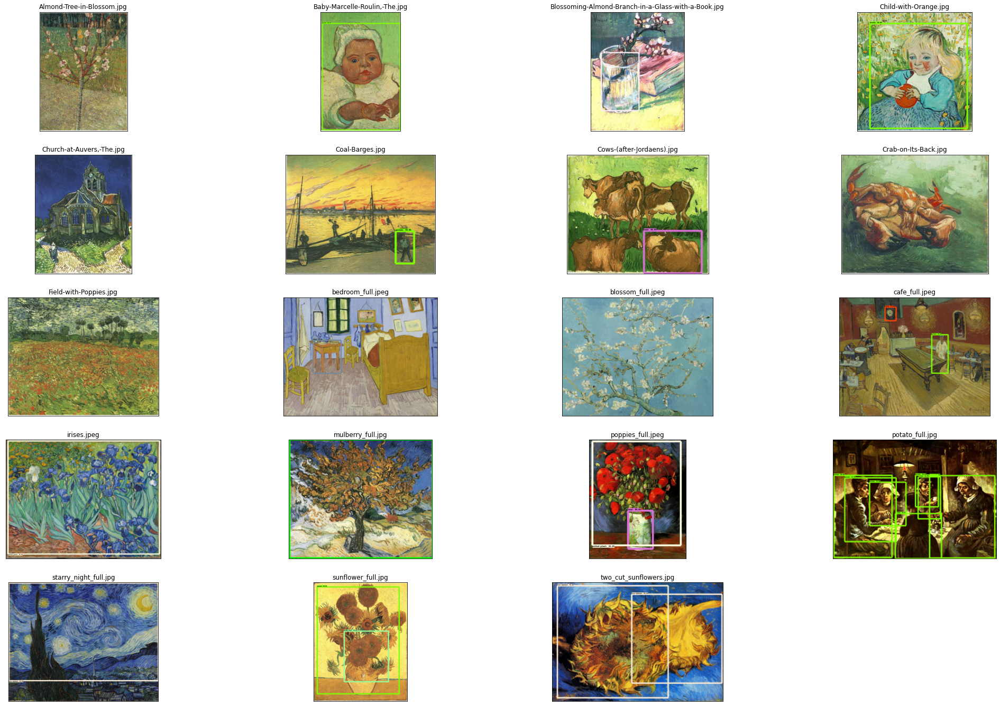

In [0]:
#@title Run model on artwork and preview results
annotated_images = []
detections = []
for image_path in TEST_IMAGE_PATHS:
    print(image_path.name)
    annotated_image, detection_results = annotate_image(detection_model, image_path, category_index)
    print('Detected: ', [category_index[c]['name'] for c in detection_results['detection_classes']])
    annotated_images.append(annotated_image)
    detections.append(detection_results)
    print()

show_image_mosaic(annotated_images, image_names)

# Step 2: Test Style Transfer Model

In [0]:
#@title Helpers and Setup
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10, 10)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools
import random

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
  max_dim = 1024
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

In [0]:
#@title
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = str(random.choice(TEST_IMAGE_PATHS))

90112/83281 [================================] - 0s 0us/step


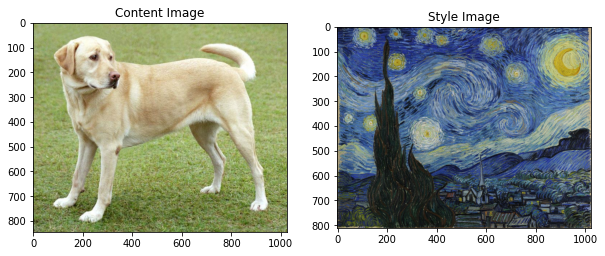

In [0]:
#@title
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

In [0]:
#@title Load Style Transfer Model
import tensorflow_hub as hub
style_transfer_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/1')

CPU times: user 17.8 s, sys: 452 ms, total: 18.2 s
Wall time: 9.55 s


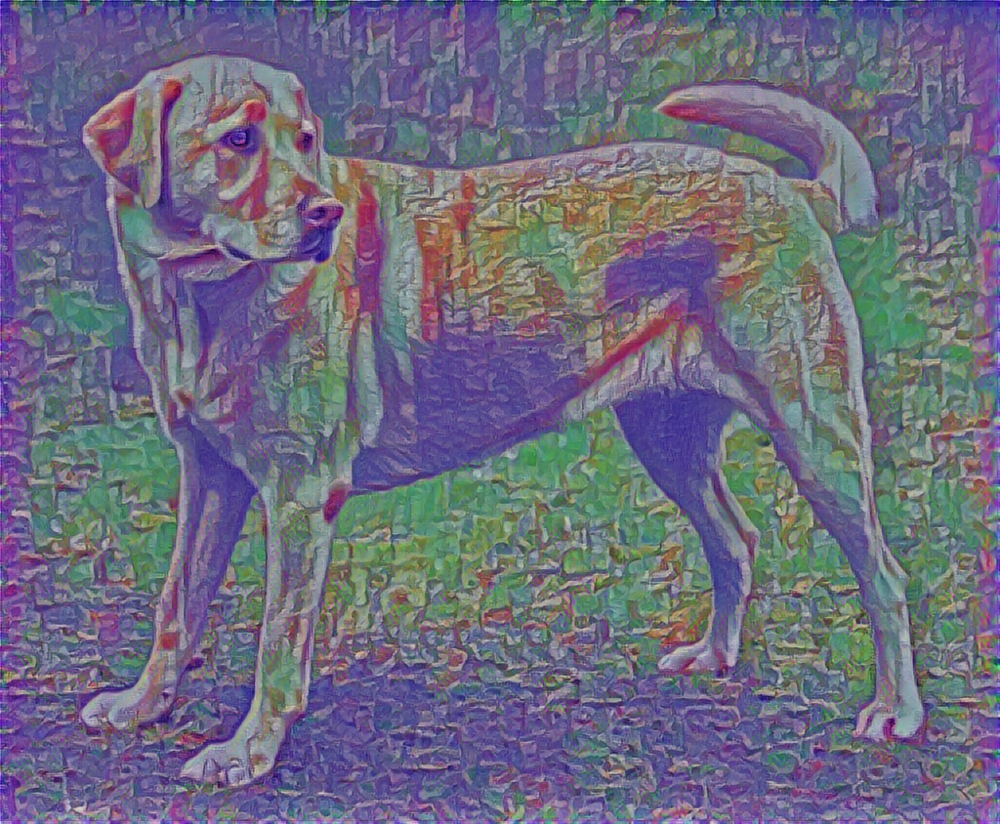

In [0]:
#@title
%time stylized_image = style_transfer_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [0]:
#@title
tensor_to_image(stylized_image).save('stylized.jpg')

/root/.keras/datasets/YellowLabradorLooking_new.jpg
Detected:  ['dog']

stylized.jpg
Detected:  ['kite', 'kite']



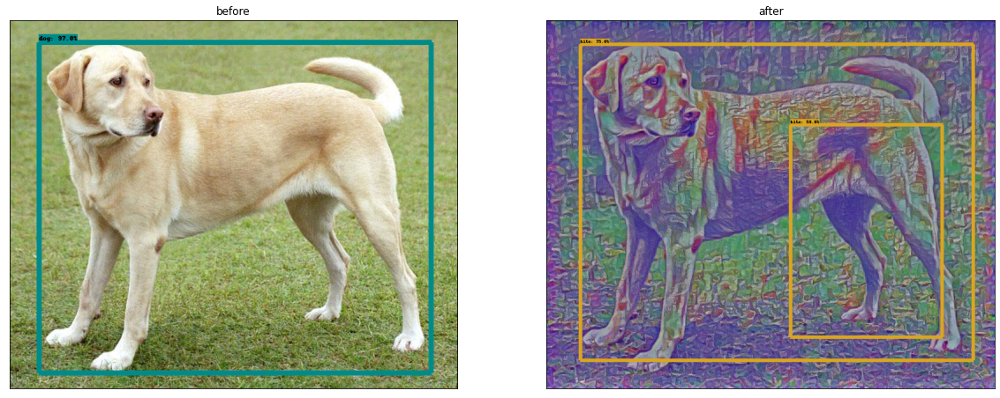

In [0]:
#@title Compare Object Detection Before/After Style Transfer
annotated_images2 = []
for image_path in [content_path, 'stylized.jpg']:
    print(image_path)
    annotated_image, detections = annotate_image(detection_model, image_path, category_index)
    print('Detected: ', [category_index[c]['name'] for c in detections['detection_classes']])
    annotated_images2.append(annotated_image)
    print()

show_image_mosaic(annotated_images2, ['before', 'after'], cols=2, thumbnail=1024)

# Aside: A Better Visualization Widget

Inspired by (and some CSS and SVG from) https://xn--hken-qoa.no/blog/cropping-3-python/#7-Output-data

In [0]:
#@title
from IPython import display
from IPython.core.display import HTML 
import base64
import jinja2

template_env = jinja2.Environment(loader=jinja2.FileSystemLoader(searchpath='.'))

def embedded_image(image_path):
  with open(image_path, 'rb') as image:
    return 'data:image/jpg;base64,' + base64.b64encode(image.read()).decode('utf-8')

def inlined_html_image(image_path):
  return f'<img src="{embedded_image(image_path)}" />'

def show_annotations_for(image_path, detections):
  tmpl = template_env.get_template('template.html')
  boxes = list(detections['detection_boxes'])
  labels = [category_index[c]['name'] for c in detections['detection_classes']]
  scores = list(detections['detection_scores'])
  return HTML(tmpl.render(image_base64=embedded_image(image_path),
                          boxes=boxes,
                          labels=labels,
                          scores=scores))

In [0]:
#@title Jinja Template for Visualization
%%writefile template.html
<style>
#image-wrapper {
    border: 2px solid black;
    display: inline-block;
    transition: transform 150ms ease-in-out;
    position: relative;
}

img {
    max-height: 800px;
    max-width: 800px;
    padding: 0;
    margin: 0;
    display: block;
}

svg.overlay {
    height: 100%;
    z-index: 10;
    shape-rendering: auto;
    position: absolute;
    top: 0;
    left: 0;
    right: 0
}

svg.overlay .feature {
    shape-rendering: geometricPrecision;
    overflow: visible;
    transition: all .5s;
    cursor: help
}

svg.overlay .feature {
    shape-rendering: geometricPrecision;
    overflow: visible;
    transition: all .5s;
    cursor: help
}

svg.overlay .feature text {
    transition: inherit;
    opacity: 0;
    pointer-events: none
}

svg.overlay .feature text tspan {
    fill: #fff;
    vector-effect: non-scaling-stroke;
    stroke: #000;
    stroke-opacity: .4;
    stroke-width: 4;
    font-weight: 500;
    paint-order: stroke
}

svg.overlay .feature circle,svg.overlay .feature path,svg.overlay .feature rect,svg.overlay .feature use {
    overflow: visible;
    vector-effect: non-scaling-stroke;
    fill: none;
    stroke: #fff
}

svg.overlay .feature .front {
    transition: all .3s;
    stroke-opacity: .8;
    stroke-width: 1.2
}

svg.overlay .feature .back {
    stroke-opacity: 0;
    stroke-width: 15
}

svg.overlay .feature .cross {
    transition: all .3s;
    pointer-events: none;
    stroke-opacity: 0
}

svg.overlay .feature:hover .cross {
    stroke-opacity: 1
}

svg.overlay .feature:hover .front {
    stroke-opacity: 1;
    stroke-width: 3
}

svg.overlay .feature:hover text {
    opacity: 1
}

</style>
<div>
  <div id="image-wrapper">
    <img src="{{image_base64}}">
    <div width="100px">
    <svg class="overlay inactive" height="100%" width="100%" viewBox="0 0 1 1" preserveAspectRatio="none">
      {% for i in range(labels | length) %}
        {% set xpos = boxes[i][1] %}
        {% set ypos = boxes[i][0] %}
        {% set width = boxes[i][3]-xpos %}
        {% set height = boxes[i][2]-ypos %}
          <svg class="feature feature-{{i}}" preserveAspectRatio="none" viewBox="0 0 2 2" x="{{xpos}}" y="{{ypos}}" width="{{width}}" height="{{height}}">
            <g>
              <circle r="1" cx="1" cy="1" class="back"></circle>
              <circle r="1" cx="1" cy="1" class="front"></circle>
              <path class="cross" d="M0,1h0.9m0.2,0h0.9M1,0v0.9m0,0.2v0.9" transform="rotate(45 1 1)"></path>
            </g>
            <text x="1" y="0.1" text-anchor="middle">
            <tspan class="label" x="1" dy="0.2" style="font-size:.15px;">{{labels[i]}}</tspan><tspan class="weight" x="1" dy="0.2" style="font-size:.15px;">{{ "%.3f"|format(scores[i]) }}</tspan>
          </svg>
      {% endfor %}
    </svg>
    </div>
  </div>
</div>

Overwriting template.html



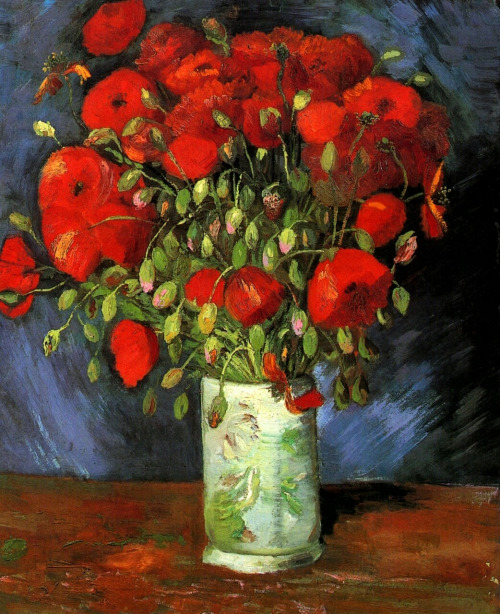

In [0]:
image_path, ds = random.choice(list(zip(TEST_IMAGE_PATHS, detections)))
show_annotations_for(image_path, ds)


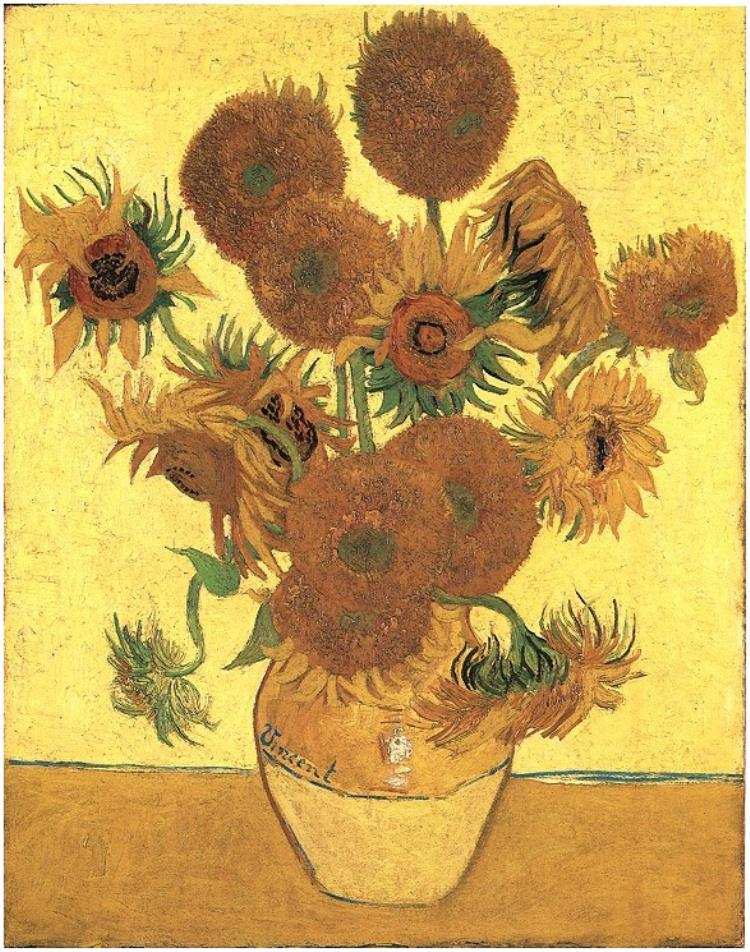

In [0]:
image_path, ds = random.choice(list(zip(TEST_IMAGE_PATHS, detections)))
show_annotations_for(image_path, ds)


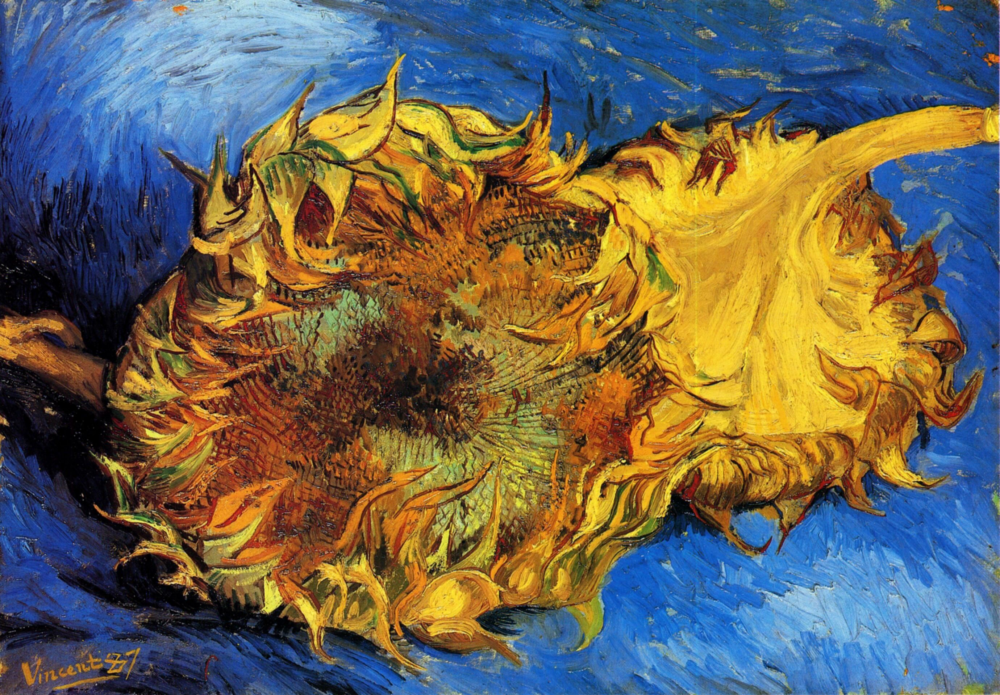

In [0]:
image_path, ds = random.choice(list(zip(TEST_IMAGE_PATHS, detections)))
show_annotations_for(image_path, ds)